# Preamble

This is an IPython Notebook to accompany the paper entitled 'The Architecture of Genome Wide Association Studies' by Melinda Mills and Charles Rahal. This allows us to share data analysis done in the construction of this data-driven review of all GWAS to date. It can also be used to dynamically replicate the analysis herein going forward. For installation guidelines, please see the readme.md which accompanies this repository. A preliminary point to note is that if you wish to run this .ipynb file itself, you *may* need to override the default settings of some versions of Jupyter Notebook (4.2 to 5.1) by opening with:

```
jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000000
```
or editing your jupyter_notebook_config.py file. Lets begin by loading in our favourite python modules, ipython magic and a bunch of custom functions we've written specifically for this project:

In [1]:
import networkx as nx
import os
import pandas as pd
import re
import seaborn as sns
import sys
import numpy as np
import csv
import itertools
import warnings
import gender_guesser.detector as gender
from Bio import Entrez
from IPython.display import HTML, display
from Support.LoadData import (
    EFO_parent_mapper,
    load_gwas_cat,
    load_pubmed_data, 
    make_timely,
    make_clean_CoR,
    download_cat
)
from Support.PubMed import (
    build_collective,
    build_author,
    build_funder,
    build_abstract,
    build_citation
)
from Support.Analysis import (
    simple_facts,
    ancestry_parser,
    make_meanfemale_andranks,
    make_funders,
    mapped_trait_summary
)
from Support.Figures import (
    gwas_growth,
    choropleth_map,
    wordcloud_figure,
    plot_heatmap,
    plot_bubbles,
    boxswarm_plot
)
from Support.Additional import clean_names
from Support.Ancestry import ancestry_cleaner

warnings.filterwarnings('ignore')
%config InlineBackend.figure_format = 'png'
%matplotlib inline
%load_ext autoreload
%autoreload 2

Then, let's dynamically grab the three main curated datasets from the GWAS Catalogue [EBI website](https://www.ebi.ac.uk) that we will need for our endeavours ('All Associations','All Studies', 'All Ancestries') and the EFO to Parent trait mapping file from their FTP site:

In [2]:
output_path = os.path.abspath(os.path.join('__file__',
                                    '../..',
                                    'data',
                                    'Catalogue',
                                    'Raw'))
ebi_download = 'https://www.ebi.ac.uk/gwas/api/search/downloads/'
download_cat(output_path, ebi_download)

Lets link the PUBMEDID variable to the PUBMED API and get a series of datasets from that using the support functions written in PubMed.py. Note: *collective* corresponds mostly consortia and study groups.

In [3]:
Cat_Studies, Cat_Ancestry, Cat_Ancestry_groupedbyN, Cat_Full = load_gwas_cat()
id_list = set(Cat_Studies['PUBMEDID'].astype(str).tolist())
Entrez.email = 'your@email.com'
papers = Entrez.read(Entrez.efetch(db='pubmed',retmode='xml', id=','.join(id_list)))
build_collective(papers)
build_author(papers)
build_funder(papers)
build_abstract(papers)
build_citation(id_list,Entrez.email)

Number of Collectives Found: 1484!
Authors with last names but no forenames: 7 out of 116193
Built a database of Authors from list of PUBMEDID IDs!
Built a database of Funders from list of PUBMEDID IDs!
Built a database of Abstracts from list of PUBMEDID IDs!


Processing for Citations: : 100%|████████████████████████████████████████████████| 3471/3471 [2:22:50<00:00,  2.47s/it]


# Introduction

## Some simple 'facts'

Lets do some basic descriptive analysis to see what we've got here:

In [4]:
Cat_Studies, Cat_Ancestry, Cat_Ancestry_groupedbyN, Cat_Full = load_gwas_cat()
FunderInfo, AbstractInfo, AuthorMaster = load_pubmed_data()
simple_facts(Cat_Studies, Cat_Ancestry,
             Cat_Ancestry_groupedbyN, Cat_Full,
             AuthorMaster)

There are currently: 3471 GWAS papers published (in terms of unique PUBMEDIDs)
The first observed GWAS in the catalogue was dated: 2005-03-10
However, only: 10 papers were published in 2005 and 2006 combined
There are currently: 5360 unique Study Accessions
There are currently: 3202 unique Diseases/Traits studied
These correspond to: 2340 unique EBI "Mapped Traits"
The total number of Associations found is currently: 75349
The average number of Associations is currently: 14.1
Mean P-Value for the strongest SNP risk allele is currently: 1.4621e-06
The number of associations reaching the 5e-8 threshold is 39788
The journal to feature the most GWAS studies since 2005-03-10 is: Nat Genet
However, in 2017, Nat Commun published the largest number of GWAS papers
Largest Accession to date: 808380.0 people.
This was published in Nat Commun.
The first author was: Helgadottir A.
Total number of SNP-trait associations is 75349.
Total number of journals publishing GWAS is 452.
The study with the la

## Can the abstracts give us any clues?

Lets make a nice infographic and do some basic NLP on the abstracts from all PUBMED IDs. This figure is the header on the readme.md:

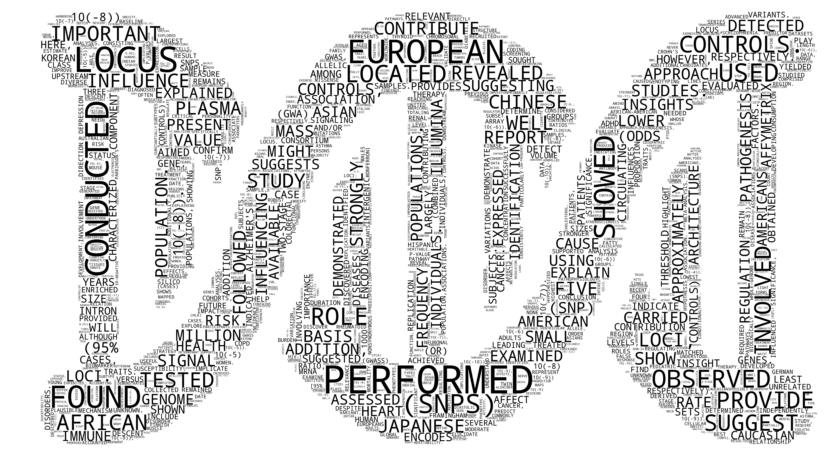

In [5]:
abstract_count = os.path.abspath(
                 os.path.join('__file__', '../..', 'data', 'PUBMED',
                              'Pubmed_AbstractCount.csv'))
output_file = os.path.abspath(
              os.path.join('__file__', '../../', 'figures', 'pdf',
                           'helix_wordcloud_1250_5000_black.pdf'))
wordcloud_figure(abstract_count, output_file)

The file Pubmed_AbstractCount in PUBMED (subdirectory of Data) details a breakdown of the abstract counts. Check counts for 'European', 'Asian', etc.

# The growth in depth and scope of GWAS over time

We can also visualise the ever increasing sample sizes and the popularity of GWAS. The top panel shows the increasing number of GWAS conducted over time. We also see increasingly large sample sizes: i.e. the fraction of 'Big N' sample size studies increases. The bottom left subplot shows that with this growth comes bigger N and a high correlatation with the number of significant Associations found. The right subplot shows the unique number of journals publishing GWAS per year and the unique number of diseases or traits studied. Both steadily increase as the appeal of GWASs broadens.

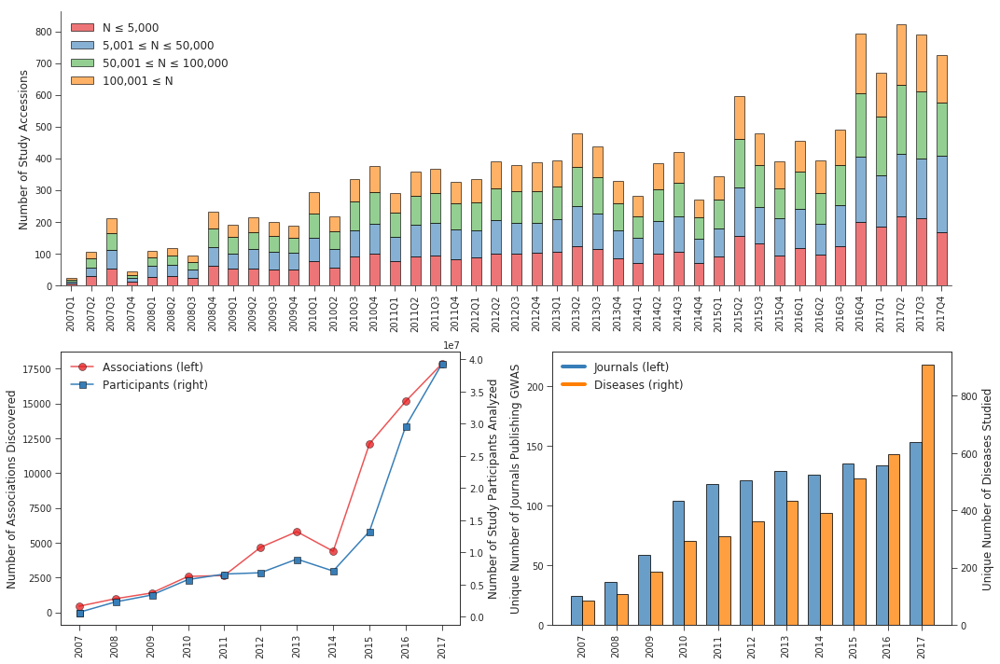

In [6]:
output_file = os.path.abspath(
              os.path.join('__file__', '../../', 'figures', 'svg',
                           'Figure_1.svg'))
Cat_Studies, Cat_Ancestry, Cat_Ancestry_groupedbyN, Cat_Full = load_gwas_cat()
gwas_growth(output_file, Cat_Studies, Cat_Ancestry, Cat_Ancestry_groupedbyN)

#  Participants

## Ancestry

This section of analysis *only* uses data contained within the catalogue, but is slightly deeper than Section 2 above and other related papers in the literature. We use the 'Broad Ancestral Category' field and aggregate from 135 combinations of 17 ancestries to 7 'broader ancestral categories' to calculate a comparable measure to Popejoy and Fullerton. To get a more detailed analysis of polyvocality, we load in some of our supporting functions to clean up the "INITIAL SAMPLE SIZE" and "REPLICATION SAMPLE SIZE" free-text fields in the catalogue and then calculate something analogous to Panofsky and Bliss. The supporting functions are based on regular expression and data wrangling techniques which exploit patterns in the these free-text fields. By way of a very simple example: “19,546 British ancestry individuals from 6863 families.” will get cleaned to two seperate fields: “19,546” and “British” which can then be used for further downstream analysis. A slightly more complex example: “2,798 European ancestry individuals, 228 French Canadian founder population individuals” will correspond to two entries of 2798 and 228 in the new ‘Cleaned N’ type variable, corresponding to ‘European’ and ‘French Canadian’ in the ‘Cleaned Ancestry’ type variable respectively. Uncomment the appropriate lines of text to get the full lists.

In [7]:
Cat_Studies, Cat_Ancestry, Cat_Ancestry_groupedbyN, Cat_Full = load_gwas_cat()
Cat_Studies['InitialClean'] = Cat_Studies.apply(
    lambda row: ancestry_cleaner(row, 'INITIAL SAMPLE SIZE'), axis=1)
output_path = os.path.abspath(
              os.path.join('__file__',
                           '../..',
                           'data',
                           'Catalogue',
                           'Synthetic',
                           'new_initial_sample.csv'))
ancestry_parser(output_path, 'InitialClean', Cat_Studies)
Cat_Studies['ReplicationClean'] = Cat_Studies.apply(
    lambda row: ancestry_cleaner(row, 'REPLICATION SAMPLE SIZE'), axis=1)
output_path = os.path.abspath(
              os.path.join('__file__',
                           '../..',
                           'data',
                           'Catalogue',
                           'Synthetic',
                           'new_replication_sample.csv'))
ancestry_parser(output_path, 'ReplicationClean', Cat_Studies)

In [8]:
clean_intial = pd.read_csv(os.path.abspath(
                           os.path.join('__file__', '../..', 'data',
                                        'Catalogue', 'Synthetic',
                                        'new_initial_sample.csv')),
                           encoding='utf-8')
clean_initial_sum = pd.DataFrame(
    clean_intial.groupby(['Cleaned Ancestry']).sum())
clean_initial_sum.rename(
    columns={'Cleaned Ancestry Size': 'Initial Ancestry Sum', }, inplace=True)
clean_initial_count = clean_intial.groupby(['Cleaned Ancestry']).count()
clean_initial_count.rename(
    columns={'Cleaned Ancestry Size': 'Initial Ancestry Count', }, inplace=True)
clean_initial_merged = clean_initial_sum.merge(pd.DataFrame(
    clean_initial_count['Initial Ancestry Count']), how='outer', left_index=True,
    right_index=True)
clean_initial_merged = clean_initial_merged.sort_values(
    by='Initial Ancestry Sum', ascending=False)
holder = ''
for index, row in clean_initial_merged.iterrows():
    holder = holder + \
        str(index) + ' (' + str(row['Initial Ancestry Sum']) + \
        ',' + str(row['Initial Ancestry Count']) + '), '
print('There are a total of ' + str(len(clean_initial_merged)) +
      ' ancestries found in the \'INITIAL SAMPLE SIZE\' column.' +
      '\nThese are: (number of people used used in all studies, ' +
      'number of studies included):\n\n' + holder[:-2] + '.\n\n')

There are a total of 204 ancestries found in the 'INITIAL SAMPLE SIZE' column.
These are: (number of people used used in all studies, number of studies included):

European (73738186,5453), British (2307399,37), Icelandic (2290333,20), East Asian (1576585,193), African American (1476705,663), Japanese (1466361,473), Finnish (915289,151), Korean (516498,231), Han Chinese (509919,372), Hispanic (389345,211), South Asian (377814,43), African (376003,131), Chinese (249250,158), Hispanic/Latino (248416,55), Indian Asian (181580,44), Latin American (162910,42), African American/Afro Caribbean (161018,36), Hispanic/Latino American (116226,12), Indian (110026,40), Asian (102091,108), Hispanic or Latino (83557,4), European and Asian (79845,2), Dutch (73925,16), Taiwanese Han Chinese (72100,14), Swedish (67990,23), Sardinian (66472,24), European American (61670,30), Northern European (59894,17), Filipino (55568,36), Latino (54928,41), Pomak (53847,31), Bangladeshi (48462,34), Hispanic/Latin Amer

In [9]:
clean_replication = pd.read_csv(os.path.abspath(
                                os.path.join('__file__',
                                             '../..',
                                             'data',
                                             'Catalogue',
                                             'Synthetic',
                                             'new_replication_sample.csv')),
                                encoding='utf-8')
clean_replication_sum = pd.DataFrame(
    clean_replication.groupby(['Cleaned Ancestry']).sum())
clean_replication_sum.rename(
    columns={'Cleaned Ancestry Size': 'Replication Ancestry Sum', }, inplace=True)
clean_replication_count = clean_replication.groupby(
    ['Cleaned Ancestry']).count()
clean_replication_count.rename(
    columns={'Cleaned Ancestry Size': 'Replication Ancestry Count', }, inplace=True)
clean_replication_merged = clean_replication_sum.merge(
    pd.DataFrame(clean_replication_count['Replication Ancestry Count']),
    how='outer', left_index=True, right_index=True)
clean_replication_merged = clean_replication_merged.sort_values(
    by='Replication Ancestry Sum', ascending=False)
holder = ''
for index, row in clean_replication_merged.iterrows():
    holder = holder + \
        str(index) + ' (' + str(row['Replication Ancestry Sum']) + \
        ',' + str(row['Replication Ancestry Count']) + '), '
print('There are a total of ' + str(len(clean_replication_merged)) +
      ' ancestries found in the \'REPLICATION SAMPLE SIZE\' column.' +
      ' These are (number of people used used in all studies, number of' +
      ' studies included):\n\n' + holder[:-2] + '.')


There are a total of 145 ancestries found in the 'REPLICATION SAMPLE SIZE' column. These are (number of people used used in all studies, number of studies included):

European (29709472,2922), East Asian (2102170,231), Icelandic (1181163,17), Japanese (1055197,289), Han Chinese (1023973,254), African American (621813,319), Chinese (409863,171), Korean (294592,140), South Asian (273982,50), British (251083,3), Asian (249628,78), European and Asian (136010,2), Hispanic (135274,102), Indian Asian (118255,14), African (117983,57), African American/Afro Caribbean (104015,48), European and African American (99227,9), European and East Asian (87155,5), Finnish (76236,23), Hispanic/Latino (62435,12), Indian (50713,47), Hispanic/Latino American (43200,6), European and Middle East/North African (29807,2), African America/Afro Caribbean (27661,1), Mexican (27148,17), Sardinian (25831,13), Latino (25299,17), Sub Saharan African (23752,26), European and  Rucphen (22789,1), Malay (22036,27), Filipin

Lets aggregate to create a dataframe for natives/indigenous people using a dictionary based classifier

In [10]:
native_dict = pd.read_csv(os.path.abspath(os.path.join('__file__', '../..',
                                         'data', 'Support',
                                         'native_classifier_dictionary.csv')),
                            index_col='Cleaned Ancestry')
native_df = pd.merge(clean_replication_merged, clean_initial_merged,
                   left_index=True,right_index=True, how='outer')
if len(np.setdiff1d(native_df.index.values, native_dict.index.values))>0:
    print('There are still ancestries which need classifying as unique!'+
         ' Add them to the dictionary: ' +
         ', '.join(np.setdiff1d(native_df.index.values,native_dict.index.values)))
else:
    print('Congratulations! The Native/Indigenous dictionary is fully up to date!')
native_df = native_df.fillna(0)
native_df['Total Ancestry Sum'] = native_df['Replication Ancestry Sum'] + \
                                  native_df['Initial Ancestry Sum']
native_df['Total Ancestry Count'] = native_df['Replication Ancestry Count'] + \
                                    native_df['Initial Ancestry Count']
native_df = pd.merge(native_df,native_dict,left_index=True, right_index=True)
print('We observe ' + str(len(native_df)) + ' unique terms for ancestry/ethnicity in total.')
print('Of these, ' + str(len(native_df[native_df['Native Population']!='Not Native'])) + 
      ' relate to native or Indigenous populations ancestry/ethnicity.')

Congratulations! The Native/Indigenous dictionary is fully up to date!
We observe 231 unique terms for ancestry/ethnicity in total.
Of these, 18 relate to native or Indigenous populations ancestry/ethnicity.


In [11]:
print('These relate to ' +
      str(len(native_df[native_df['NativeType']=='Indicated']['Native Population'].unique())) + 
      ' specific native/indigenous groups as implied by the free text.')
print('These are: '+
     ', '.join(native_df[native_df['NativeType']=='Indicated']['Native Population'].unique()))
print('Out of ' + str(int(native_df['Total Ancestry Count'].sum())) +
     ' mentions of ancestry\ethnicity, ' +
     str(int(native_df[native_df['NativeType']=='Indicated']['Total Ancestry Count'].sum())) + 
     ' relate to native/indigenous groups as implied by the free text.' +
     '('+
      str(round(native_df[native_df['NativeType']=='Indicated']['Total Ancestry Count'].sum()/
      native_df['Total Ancestry Count'].sum()*100,3)) +'%)')
print('Out of ' + str(int(native_df['Total Ancestry Sum'].sum())) +
     ' participants, ' +
     str(int(native_df[native_df['NativeType']=='Indicated']['Total Ancestry Sum'].sum())) + 
     ' are of native/indigenous groups as implied by the free text.'  +
     '('+
      str(round(native_df[native_df['NativeType']=='Indicated']['Total Ancestry Sum'].sum()/
      native_df['Total Ancestry Sum'].sum()*100,3)) +'%)')
print('Most commonly used natives implied by the free text is: ' +
     native_df[native_df['NativeType']=='Indicated']['Total Ancestry Sum'].sort_values(ascending=False).index.values[0] +
     ' which contributed ' + 
      str(int(native_df[native_df['NativeType']=='Indicated']['Total Ancestry Sum'].sort_values(ascending=False)[0]))+
     ' people in terms of sample.')

These relate to 7 specific native/indigenous groups as implied by the free text.
These are: Aboriginal Canadians, Hispanic/Native American, Indigenous Australian, Native Americans, Indigenous peoples of South America, Native Americans or Alaska Natives, Native Hawaiians
Out of 15078 mentions of ancestry\ethnicity, 32 relate to native/indigenous groups as implied by the free text.(0.212%)
Out of 127960907 participants, 8175 are of native/indigenous groups as implied by the free text.(0.006%)
Most commonly used natives implied by the free text is: Native Hawaiian which contributed 3179 people in terms of sample.


In [12]:
print('These relate to ' +
      str(len(native_df[native_df['NativeType']!='Not Native']['Native Population'].unique())) + 
      ' specific native/indigenous implied by the free text or which are manually classified.')
print('These are: '+
     ', '.join(native_df[native_df['NativeType']!='Not Native']['Native Population'].unique()))
print('Out of ' + str(int(native_df['Total Ancestry Count'].sum())) +
     ' mentions of ancestry\ethnicity, ' +
     str(int(native_df[native_df['NativeType']!='Not Native']['Total Ancestry Count'].sum())) + 
     ' relate to native/indigenous populations implied by the free text or which are manually classified.' +
     '('+
      str(round(native_df[native_df['NativeType']!='Not Native']['Total Ancestry Count'].sum()/
      native_df['Total Ancestry Count'].sum()*100,3)) +'%)')
print('Out of ' + str(int(native_df['Total Ancestry Sum'].sum())) +
     ' participants, ' +
     str(int(native_df[native_df['NativeType']!='Not Native']['Total Ancestry Sum'].sum())) + 
     ' are of native/indigenous populations implied by the free text or which are manually classified.' +
     '('+
      str(round(native_df[native_df['NativeType']!='Not Native']['Total Ancestry Sum'].sum()/
      native_df['Total Ancestry Sum'].sum()*100,3)) +'%)')
print('Most commonly used natives implied by the free text or which are manually classified is: ' +
     native_df[native_df['NativeType']!='Not Native']['Total Ancestry Sum'].sort_values(ascending=False).index.values[0] +
     ' which contributed ' + 
      str(int(native_df[native_df['NativeType']!='Not Native']['Total Ancestry Sum'].sort_values(ascending=False)[0]))+
     ' people in terms of sample.')

These relate to 15 specific native/indigenous implied by the free text or which are manually classified.
These are: Aboriginal Canadians, Native American, Pacific Islander, Bashkirs, Saami, Hispanic/Native American, Indigenous Australian, Mayan, Native Americans, Indigenous peoples of South America, Native Americans or Alaska Natives, Native Hawaiians, Pima Indians, Plains Indians, Samoan
Out of 15078 mentions of ancestry\ethnicity, 77 relate to native/indigenous populations implied by the free text or which are manually classified.(0.511%)
Out of 127960907 participants, 33151 are of native/indigenous populations implied by the free text or which are manually classified.(0.026%)
Most commonly used natives implied by the free text or which are manually classified is: American Indian which contributed 10743 people in terms of sample.


Lets first now do a quick check that our 'Broader' dictionary is up to date:

In [13]:
if len(Cat_Ancestry[Cat_Ancestry['Broader'].isnull()]) > 0:
    print('Perhaps we need to update the dictionary for new terms?')
    print('Something like these ones: ' +
         ','.join(Cat_Ancestry[Cat_Ancestry['Broader'].isnull()]['BROAD ANCESTRAL'].unique()))
else:
    print('Nice! Looks like our Broad to Broader dictionary is up to date!')

Nice! Looks like our Broad to Broader dictionary is up to date!


Lets put this number into tables to get a deeper understanding, first including a row which has at least one ancestry as NR, and then dropping all rows in which at least one recorded ancestry is NR:

In [14]:
Broad_Ancestral_Full_initial = pd.DataFrame(
    Cat_Ancestry[Cat_Ancestry.STAGE ==
                 'initial'].groupby(['Broader'])['N'].sum())
Broad_Ancestral_Full_initial.rename(
    columns={'N': 'N (Initial)'}, inplace=True)
Broad_Ancestral_Full_replication = pd.DataFrame(
    Cat_Ancestry[Cat_Ancestry.STAGE ==
                 'replication'].groupby(['Broader'])['N'].sum())
Broad_Ancestral_Full_replication.rename(
    columns={'N': 'N (Replication)'}, inplace=True)
Broad_Ancestral_Full = pd.merge(Broad_Ancestral_Full_initial,
                                Broad_Ancestral_Full_replication,
                                left_index=True, right_index=True)
Broad_Ancestral_Full['Total'] = Broad_Ancestral_Full['N (Initial)'] + \
    Broad_Ancestral_Full['N (Replication)']
Broad_Ancestral_Full['% Discovery'] = (
    Broad_Ancestral_Full['N (Initial)'] /
    Broad_Ancestral_Full['N (Initial)'].sum()) * 100
Broad_Ancestral_Full['% Replication'] = (
    Broad_Ancestral_Full['N (Replication)'] /
    Broad_Ancestral_Full['N (Replication)'].sum()) * 100
Broad_Ancestral_Full['% Total'] = (Broad_Ancestral_Full['Total'] /
                                   Broad_Ancestral_Full['Total'].sum()) * 100
Broad_Ancestral_Full.to_csv(os.path.abspath(
                            os.path.join('__file__',
                                         '../..',
                                         'tables',
                                         'Broad_Ancestral_Full.csv')))
Broad_Ancestral_Full

,N (Initial),N (Replication),Total,% Discovery,% Replication,% Total
Broader,,,,,,
African,280707,129832,410539,0.288904,0.296802,0.291356
African Am./Caribbean,1755647,816448,2572095,1.806916,1.866435,1.825394
Asian,5560778,5703016,11263794,5.723167,13.037341,7.993818
European,80298949,31062199,111361148,82.643881,71.009528,79.032050
Hispanic/Latin American,1274360,387000,1661360,1.311575,0.884699,1.179053
In Part Not Recorded,7442500,4813028,12255528,7.659840,11.002790,8.697643
Other/Mixed,549666,832183,1381849,0.565718,1.902406,0.980686


Drop the 'in part not recorded' rows (i.e. where the Broad Ancestral Category contains at least one NR):

In [15]:
Broad_Ancestral_NoNR = Broad_Ancestral_Full[['N (Initial)',
                                             'N (Replication)',
                                             'Total']]
Broad_Ancestral_NoNR = Broad_Ancestral_NoNR.drop('In Part Not Recorded')
Broad_Ancestral_NoNR['Total'] = Broad_Ancestral_NoNR['N (Initial)'] + \
    Broad_Ancestral_NoNR['N (Replication)']
Broad_Ancestral_NoNR['% Discovery'] = (
    Broad_Ancestral_NoNR['N (Initial)'] /
    Broad_Ancestral_NoNR['N (Initial)'].sum()) * 100
Broad_Ancestral_NoNR['% Replication'] = (
    Broad_Ancestral_NoNR['N (Replication)'] /
    Broad_Ancestral_NoNR['N (Replication)'].sum()) * 100
Broad_Ancestral_NoNR['% Total'] = (Broad_Ancestral_NoNR['Total'] /
                                   Broad_Ancestral_NoNR['Total'].sum()) * 100
Broad_Ancestral_NoNR.to_csv(os.path.abspath(
                            os.path.join('__file__', '../..', 'tables',
                                         'Broad_Ancestral_NoNR.csv')))
Broad_Ancestral_NoNR

,N (Initial),N (Replication),Total,% Discovery,% Replication,% Total
Broader,,,,,,
African,280707,129832,410539,0.312870,0.333495,0.319111
African Am./Caribbean,1755647,816448,2572095,1.956804,2.097184,1.999284
Asian,5560778,5703016,11263794,6.197917,14.649157,8.755325
European,80298949,31062199,111361148,89.499391,79.788487,86.560799
Hispanic/Latin American,1274360,387000,1661360,1.420373,0.994075,1.291372
Other/Mixed,549666,832183,1381849,0.612645,2.137602,1.074108


What are the broad ancestral fields before we visualise the broader field? Dropping all rows for multiple (comma separated entries):

Lets now make some bubble plots to visualise the raw broad ancestry field and our fields extracted from the free text strings:

In [16]:

GroupAnc = Cat_Ancestry[(Cat_Ancestry['BROAD ANCESTRAL'] != 'Other') &
                        (Cat_Ancestry['BROAD ANCESTRAL'].str.count(',') == 0)].\
    groupby(['BROAD ANCESTRAL'])['N'].sum().to_frame()
GroupAnc['Individuals (%)'] = (GroupAnc['N'] /
                               GroupAnc['N'].sum()) * 100
GroupAnc.sort_values(by='Individuals (%)',ascending=False)[0:10]

,N,Individuals (%)
BROAD ANCESTRAL,,
European,111361148,81.198417
NR,10035765,7.317527
East Asian,9399352,6.853490
African American or Afro-Caribbean,2572095,1.875430
Hispanic or Latin American,1661360,1.211372
South Asian,1291062,0.941371
Asian unspecified,312148,0.227601
African unspecified,260838,0.190189
South East Asian,116593,0.085013


Now lets visualise the occurances of the 'Broader' ancestry conversion:

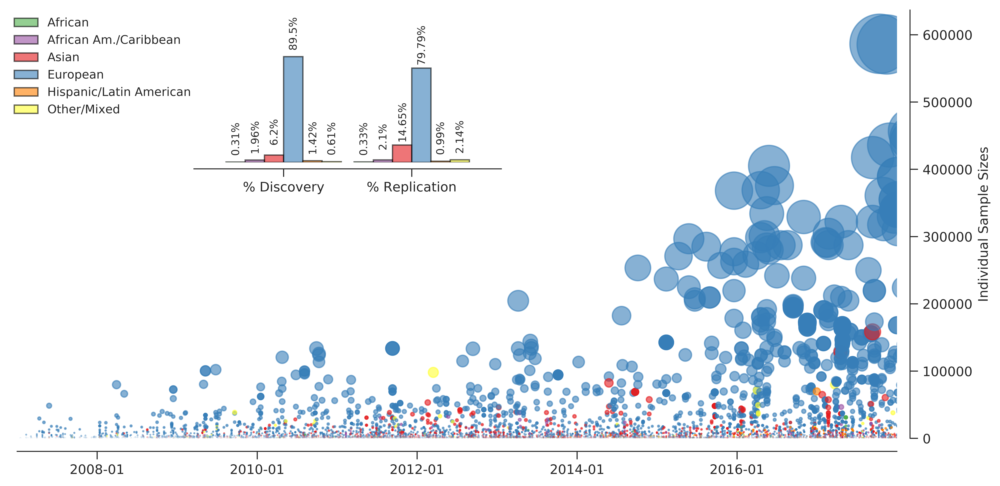

In [17]:
countriesdict = {'African': '#4daf4a', 'African Am./Caribbean': '#984ea3',
                 'Asian': '#e41a1c', 'European': '#377eb8',
                 'Hispanic/Latin American': '#ff7f00', 'Other/Mixed': '#ffff33'}
output_path = os.path.abspath(os.path.join('__file__', "../..", "figures", "svg",
                                             "Figure_2.svg"))
plot_bubbles(output_path, Cat_Ancestry, Broad_Ancestral_NoNR, countriesdict)

We can also analyze how these aggregates change over time, and this was a key feature of [Popejoy and Fullerton (2016)](https://www.nature.com/news/genomics-is-failing-on-diversity-1.20759). We can provide a much more granular arguement (merely remove '_NoNR' from the cell below to undertake an equivlent analysis with rows which contain some in part NR ancestries):

In [18]:
index = [x for x in range(2007, 2018)]
columns = ['European', 'Asian', 'African', 'Hispanic/Latin American',
           'Other/Mixed', 'African Am./Caribbean']
Cat_Ancestry_NoNR = Cat_Ancestry[
    Cat_Ancestry['Broader'] != 'In Part Not Recorded']
Broad_Ancestral_Time_NoNR_PC = pd.DataFrame(index=index, columns=columns)
for year in range(2007, 2018):
    for broaderancestry in Broad_Ancestral_NoNR.index.tolist():
        Broad_Ancestral_Time_NoNR_PC[broaderancestry.strip()][year] =\
            (Cat_Ancestry_NoNR[(
                Cat_Ancestry_NoNR['DATE'].str.contains(str(year))) &
                (Cat_Ancestry_NoNR['Broader'] ==
                 broaderancestry)]['N'].sum() /
             Cat_Ancestry_NoNR[
             (Cat_Ancestry_NoNR['DATE'].str.contains(
                 str(year)))]['N'].sum()) * 100
Broad_Ancestral_Time_NoNR_PC.to_csv(os.path.abspath(
                            os.path.join('__file__', '../..', 'tables',
                                         'Broad_Ancestral_Time_NoNR_PC.csv')))
Broad_Ancestral_Time_NoNR_PC.head(12)

,European,Asian,African,Hispanic/Latin American,Other/Mixed,African Am./Caribbean
2007,95.4688,2.13984,0.00542792,0.715245,1.18391,0.486807
2008,95.2884,2.94597,0,0.00180063,1.21894,0.544872
2009,88.1708,7.10488,0.258137,0.224117,3.36046,0.881605
2010,86.6601,10.04,0.270719,0.0591476,2.47158,0.49843
2011,78.2623,15.8296,0.15027,0.397721,1.70956,3.65056
2012,71.9735,19.4701,0.313032,0.884615,2.87484,4.4839
2013,82.1979,11.6865,0.394273,0.787581,0.617715,4.31598
2014,76.5528,18.6293,0.252209,1.16138,0.985863,2.41848
2015,84.7624,11.6534,0.356186,0.937313,0.652741,1.63797
2016,90.9422,4.56809,0.196006,1.56451,1.28745,1.44175


We can focus on the initial discovery stage to calculate the number of individuals required per ancestry to unconver one hit. Note however that this does require some distributional assumptions (i.e. that the same diseases are being studied across ancestries).

In [19]:
Cat_Ancestry_Initial = Cat_Ancestry[Cat_Ancestry['STAGE'] == 'initial']

Cat_Ancestry_NoDups = Cat_Ancestry_Initial.drop_duplicates(
    subset=['STUDY ACCESSION'],
    keep=False)[['PUBMEDID', 'STUDY ACCESSION',
                 'BROAD ANCESTRAL',
                 'N']]
Cat_Ancestry_NoDups_merge = pd.merge(Cat_Ancestry_NoDups,
                                     Cat_Studies[['ASSOCIATION COUNT',
                                                  'STUDY ACCESSION',
                                                  'MAPPED_TRAIT']],
                                     how='left', on='STUDY ACCESSION')

listtoiterate = ['European', 'East Asian', 'South Asian',
                 'African Am.\Caribbean', 'Hispanic\Latin American']
for ancestry in listtoiterate:
    temp = Cat_Ancestry_NoDups_merge[Cat_Ancestry_NoDups_merge[
        'BROAD ANCESTRAL'].str.strip() == ancestry]
    print('The number of ' + ancestry + 's required to find one hit: ' +
          str(round(1 /
                    (temp['ASSOCIATION COUNT'].sum() / temp['N'].sum()), 1)))


The number of Europeans required to find one hit: 1421.1
The number of East Asians required to find one hit: 785.1
The number of South Asians required to find one hit: 577.8
The number of African Am.\Caribbeans required to find one hit: nan
The number of Hispanic\Latin Americans required to find one hit: nan


## Choropleth map of country of recruitment

This is a choropleth map of country of recruitment - note that this field is not quite fully populated in the Catalogue. Basemap code is loosely based on [this](http://ramiro.org/notebook/basemap-choropleth/). As we want to study the number of people recruited from each country, we can only utilize values in the ‘Country of Recruitment’ field when only one country is mentioned. For example: if N=100,000 and Country of Recruitment = {U.K., U.S.}, there is no way for us to know what the breakdown between the two countries is in the Catalogue (especially as the free text field may just contain 'European' ancestry). Our only option in this scenario is to drop such observations. This forces us to drop about 22% of all the studies, and this corresponds to about 48% of the Catalogue as measured by N (because bigger studies have multiple countries of recruitment). We are faced with multiple entries equal to ‘NR’, which corresponds to ‘not recorded’. This reduces the number of studies to go into the map by a further 21% (of the initial total), and this means that the map only includes about half of all GWAS studies. This has no relationship to whether ancestry is coded.

In [20]:
Cat_Studies, Cat_Ancestry, Cat_Ancestry_groupedbyN, Cat_Full = load_gwas_cat()
Clean_CoR = make_clean_CoR(Cat_Ancestry)
Cleaned_CoR_N = pd.DataFrame(Clean_CoR.groupby(['Cleaned Country'])['N'].sum())
Cleaned_CoR_N['Rank_N'] = Cleaned_CoR_N.rank(
    ascending=False, method='dense').astype(int)
Cleaned_CoR_count = pd.DataFrame(
    Clean_CoR.groupby(['Cleaned Country'])['N'].count())
Cleaned_CoR_count['Rank_count'] = Cleaned_CoR_count.rank(
    ascending=False, method='dense').astype(int)
Cleaned_CoR_count = Cleaned_CoR_count.rename(columns={'N': 'Count'})
Cleaned_CoR = pd.merge(Cleaned_CoR_count, Cleaned_CoR_N,
                       left_index=True, right_index=True)
del Cleaned_CoR.index.name
Cleaned_CoR['Count (%)'] = round((Cleaned_CoR['Count'] /
                                   Cleaned_CoR['Count'].sum()) * 100,2)
Cleaned_CoR['N (%)'] = round((Cleaned_CoR['N'] /
                               Cleaned_CoR['N'].sum()) * 100,2)
countrylookup = pd.read_csv(os.path.abspath(
                            os.path.join('__file__',
                                         '../..',
                                         'data',
                                         'ShapeFiles',
                                         'Country_Lookup.csv')),
                            index_col='Country')
country_merged = pd.merge(countrylookup,
                          Cleaned_CoR,
                          left_index=True,
                          right_index=True)
country_merged['Per Rec'] = round(country_merged['N']/pd.to_numeric(country_merged['2017population']),2)
country_merged.sort_values('Rank_N', ascending=True)[
    ['Continent', 'Count', 'N', 'Count (%)', 'N (%)', 'Per Rec']].to_csv(
    os.path.abspath(os.path.join('__file__',
                                 '../..',
                                 'tables',
                                 'CountryOfRecruitment.csv')))
country_merged.sort_values('Rank_N', ascending=True)[
    ['Continent', 'Count', 'N', 'Count (%)', 'N (%)', 'Per Rec']].head(10)

Cleaning for single country of recruitment: 72.815%  obs remain. 
This represents about 55.955% of the total GWAS N. 
When we drop for country==NR, we lose another: 24.69% papers.
5747 obs for this field remain out of a total of 10480 rows of Cat_Anc data


,Continent,Count,N,Count (%),N (%),Per Rec
United Kingdom,Europe,613,17825964,10.67,40.84,0.27
United States,North America,2378,9517832,41.38,21.81,0.03
Iceland,Europe,71,6409109,1.24,14.69,19.13
Japan,Asia,382,2523855,6.65,5.78,0.02
China,Asia,462,1971966,8.04,4.52,0.00
Finland,Europe,206,1172986,3.58,2.69,0.21
"Korea, South",Asia,238,795264,4.14,1.82,0.02
Netherlands,Europe,168,661953,2.92,1.52,0.04
Germany,Europe,167,414993,2.91,0.95,0.01
Australia,Oceania,108,319142,1.88,0.73,0.01


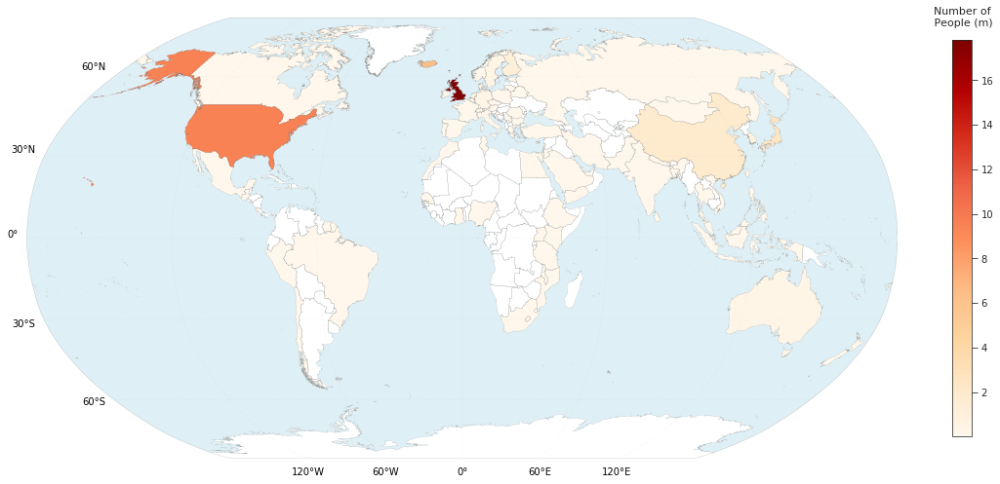

In [21]:
output_path = os.path.abspath(os.path.join('__file__',
                                           '../..',
                                           'figures',
                                           'svg',
                                           'Figure_3.svg'))
choropleth_map(country_merged, 'N', 'OrRd', output_path)

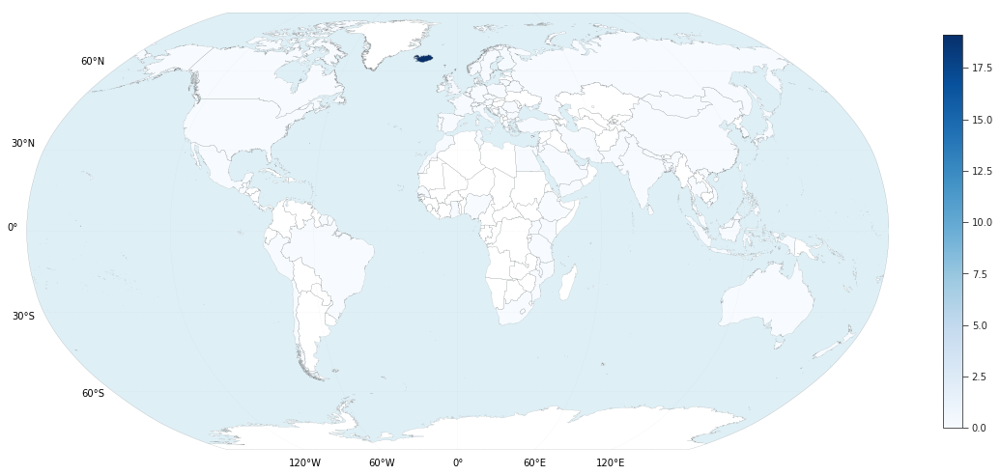

In [22]:
output_path = os.path.abspath(os.path.join('__file__',
                                           '../..',
                                           'figures',
                                           'svg',
                                           'Figure_3_Blues.svg'))
choropleth_map(country_merged, 'Per Rec', 'Blues', output_path)

Lets now merge that via a country lookup to continent based file using data from within the shapefile itself (based on CIAWF).

In [23]:
country_merged_sumcount = country_merged[[
    'Continent', 'Count']].groupby(['Continent']).sum()
country_merged_sumN = country_merged[[
    'Continent', 'N']].groupby(['Continent']).sum()
country_merged_sums = pd.merge(
    country_merged_sumN, country_merged_sumcount,
    left_index=True, right_index=True)
country_merged_sums['N (%)'] = (
    country_merged_sums['N'] / country_merged_sums['N'].sum()) * 100
country_merged_sums['Count (%)'] = (
    country_merged_sums['Count'] / country_merged_sums['Count'].sum()) * 100
country_merged_sums.to_csv(os.path.abspath(
                           os.path.join('__file__',
                                        '../..',
                                        'tables',
                                        'ContinentOfRecruitment.csv')))
country_merged_sums

,N,Count,N (%),Count (%)
Continent,,,,
Africa,46104,48,0.105638,0.835218
Asia,5901733,1377,13.522686,23.960327
Europe,27702658,1705,63.475311,29.667653
North America,9635279,2470,22.077388,42.978946
Oceania,331082,117,0.758611,2.035845
Seven seas (open ocean),1389,1,0.003183,0.017400
South America,24957,29,0.057184,0.504611


# Who funds GWAS and what do they fund?

## A simple descriptive tabulation

Lets do a super simple tabulation of the Top 20 GWAS funders (measured by 'GWAS contributions': i.e. a funder funding an authors time on a paper).

In [24]:
FunderInfo, AbstractInfo, AuthorMaster = load_pubmed_data()
AllFunders = FunderInfo.groupby(by='Agency').count()
AllFunders.index.name = None
AllFunders = AllFunders.reset_index()
AllFunders = AllFunders.rename(columns={
                               'index': 'Agency',
                               'PUBMEDID': 'Grant Contributions',
                               'GrantCountry': 'Country'})
AllFunders_withcountries = pd.merge(AllFunders[['Agency',
                                                'Grant Contributions']],
                                    FunderInfo[['Agency',
                                                'GrantCountry']].drop_duplicates(
                                        'Agency'),
                                    on='Agency', how='left')
AllFunders_withcountries = AllFunders_withcountries.set_index('Agency')
AllFunders_withcountries.index.name = None
AllFunders_withcountries['% of Total'] = round((
    AllFunders_withcountries['Grant Contributions'] /
    AllFunders_withcountries['Grant Contributions'].sum()) * 100, 2)
AllFunders_withcountries.sort_values(
    'Grant Contributions', ascending=False)[0:20]

,Grant Contributions,GrantCountry,% of Total
NHLBI NIH HHS,12292,United States,26.02
NCI NIH HHS,5068,United States,10.73
NIA NIH HHS,3990,United States,8.45
MRC,3359,United Kingdom,7.11
NIMH NIH HHS,2626,United States,5.56
NIDDK NIH HHS,2575,United States,5.45
NHGRI NIH HHS,1753,United States,3.71
Wellcome Trust,1751,United Kingdom,3.71
NCRR NIH HHS,1527,United States,3.23
PHS HHS,1140,United States,2.41


Lets print out some simple descriptives from this data:

In [25]:
print('There are ' + str(len(FunderInfo['Agency'].drop_duplicates())) +
      ' unique funders returned from PubMed Central.')
print('There are ' + str(len(FunderInfo['GrantID'].drop_duplicates())) +
      ' unique grants returned from PubMed Central.')
print('There are ' + str(len(FunderInfo['GrantCountry'].drop_duplicates())) +
      ' unique grant countries returned from PubMed Central.')
print('Each study has an average of ' +
      str(round(len(FunderInfo) / len(id_list), 2)) + ' grants funding it.')
grantgroupby = FunderInfo.groupby(['Agency', 'GrantID']).size().groupby(
    level=1).max().sort_values(ascending=False).reset_index()
print('The most frequently acknowledged grant is GrantID ' +
      grantgroupby['GrantID'][0] + '.\nThis grant is acknowledged ' +
      str(grantgroupby[0][0]) + ' times.')

There are 93 unique funders returned from PubMed Central.
There are 12486 unique grants returned from PubMed Central.
There are 7 unique grant countries returned from PubMed Central.
Each study has an average of 13.61 grants funding it.
The most frequently acknowledged grant is GrantID P30 DK063491.
This grant is acknowledged 198 times.


## International distribution of funders

From which countries do these grants come from?

In [26]:
TopCountryFunders = FunderInfo.groupby(by='GrantCountry').count()
TopCountryFunders = TopCountryFunders.rename(
    columns={'PUBMEDID': 'Number Of Studies'})
TopCountryFunders = TopCountryFunders.sort_values(
    'Number Of Studies', ascending=False)[['Number Of Studies']]
TopCountryFunders = TopCountryFunders.reset_index().rename(
    columns={'GrantCountry': 'Country of Funder'})
TopCountryFunders['Percent Funded (%)'] = (
    TopCountryFunders['Number Of Studies'] /
    TopCountryFunders['Number Of Studies'].sum()) * 100
TopCountryFunders = TopCountryFunders.set_index('Country of Funder')
TopCountryFunders.index.name = None
TopCountryFunders.head(10)

,Number Of Studies,Percent Funded (%)
United States,40246,85.272369
United Kingdom,6710,14.217005
Canada,172,0.364430
International,57,0.120770
Austria,7,0.014831
Italy,5,0.010594


## What about the commas?

Lets first get a metric about splitting on the commas in the EFO field. We can make identical heatmaps by just replacing ```EFO_Parent_Mapped``` with ```EFO_Parent_Mapped_NoCommas```. This is inherently making the assumption that a GWAS which has two mentioned EFO contributes equally to each of them: as much as a GWAS with one EFO (i.e. no comma to split on) contributes to that one specific EFO.

In [27]:
Cat_Studies, Cat_Ancestry, Cat_Ancestry_groupedbyN, Cat_Full = load_gwas_cat()
EFO_Parent_Mapped, EFO_Parent_Mapped_NoCommas = EFO_parent_mapper(
    Cat_Studies, Cat_Ancestry_groupedbyN)
print('There are ' + str(len(EFO_Parent_Mapped)) +
      ' rows of EFO terms after we split for commas.')
print('This indicates ' + str(len(EFO_Parent_Mapped) -\
                              len(EFO_Parent_Mapped_NoCommas)) +
      ' additional terms were mapped than for when we drop csvs.')
print('This indicates ' +
      str(len(EFO_Parent_Mapped['EFO term'].drop_duplicates())) +
      ' unique EFO terms to map to Parents.')
print('This is in comparison to ' +
      str(len(EFO_Parent_Mapped_NoCommas['EFO term'].drop_duplicates())) +
      ' unique EFO terms in Cat_Studies.')

There are 7326 rows of EFO terms after we split for commas.
This indicates 3384 additional terms were mapped than for when we drop csvs.
This indicates 1873 unique EFO terms to map to Parents.
This is in comparison to 1299 unique EFO terms in Cat_Studies.


## What do they study?


In [28]:
mapped_trait_summary(EFO_Parent_Mapped, 'EFO term')
mapped_trait_summary(EFO_Parent_Mapped_NoCommas,'EFO term')

                             Sample   Studies  Associations
EFO term                                                   
Type II Diabetes Mellitus  1.902095  1.191291      0.710751
Schizophrenia              1.135693  1.150212      1.234129
Body Mass Index            3.496958  1.136519      2.605454
Bipolar Disorder           0.450667  1.013282      0.353153
Breast Carcinoma           1.165492  0.999589      0.795229
Alzheimers Disease         0.603587  0.944817      0.366491
Unipolar Depression        2.316467  0.931124      0.362045
HD LC measurement          0.950346  0.903738      1.133137
Asthma                     0.408873  0.807887      0.349342
Triglyceride Meas.         0.908699  0.780501      1.109636
Colorectal Cancer          0.721135  0.780501      0.272486
LD LC measurement          0.835898  0.712036      0.987049
Prostate Carcinoma         0.598055  0.643571      0.311232
Rheumatoid Arthritis       0.742121  0.602492      0.317583
Coronary Heart Disease     0.611394  0.5

In [29]:
mapped_trait_summary(EFO_Parent_Mapped, 'Parent term')
mapped_trait_summary(EFO_Parent_Mapped_NoCommas, 'Parent term')

                              Sample    Studies  Associations
Parent term                                                  
Other Meas.                25.110017  29.275640     40.422005
Neurological Disorder       9.835816  10.762700      4.988599
Other Disease               5.892789   7.887170      3.041178
Cancer                      7.271186   6.750650      3.106600
Response To Drug            2.440808   6.298781      4.009807
Lipid/Lipoprotein Meas.     4.036106   5.162262      6.340233
Other Trait                 4.251176   4.984253      2.144958
Digestive System Disorder   3.874280   4.285910      2.463811
Cardiovascular Disease      8.447140   4.258524      1.847065
Immune System Disorder      3.406493   3.724497      2.385686
Biological Process          4.554861   3.642339      4.301984
Cardiovascular Meas.        3.078589   3.245242      3.339071
Body Meas.                  8.577217   3.176777     10.010861
Hematological Meas.         4.996745   2.724908      5.310628
Metaboli

## Who's funding what?

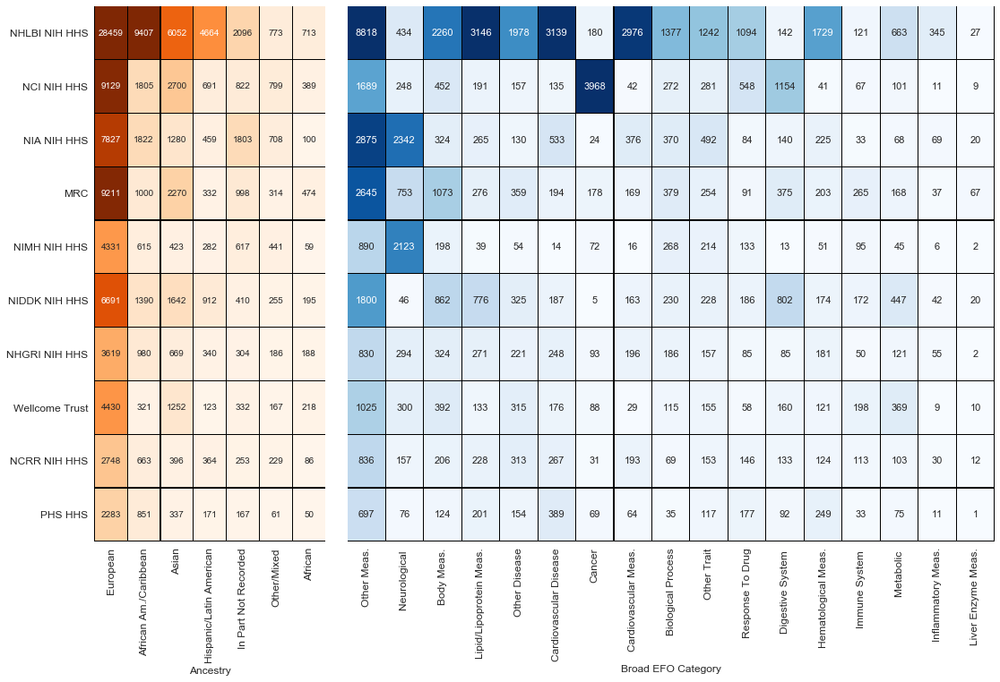

In [30]:
FunderInfo, AbstractInfo, AuthorMaster = load_pubmed_data()
Cat_Studies, Cat_Ancestry, Cat_Ancestry_groupedbyN, Cat_Full = load_gwas_cat()
EFO_Parent_Mapped, EFO_Parent_Mapped_NoCommas = EFO_parent_mapper(
    Cat_Studies, Cat_Ancestry_groupedbyN)

EFO_Parent_Mapped['Parent term'] = \
    EFO_Parent_Mapped['Parent term'].str.replace('Disorder', '')

FunderInfo_Parent = pd.merge(FunderInfo, EFO_Parent_Mapped,
                             left_on='PUBMEDID', right_on='PUBMEDID',
                             how='left')

funder_ancestry, funder_parent = make_funders(FunderInfo_Parent, FunderInfo, Cat_Ancestry)
output_path = os.path.abspath(os.path.join('__file__',
                                           '../..',
                                           'figures',
                                           'svg',
                                           'Figure_4.svg'))
plot_heatmap(funder_ancestry, funder_parent, output_path)

Lets do the same thing, but instead drop not split on the EFO commas:

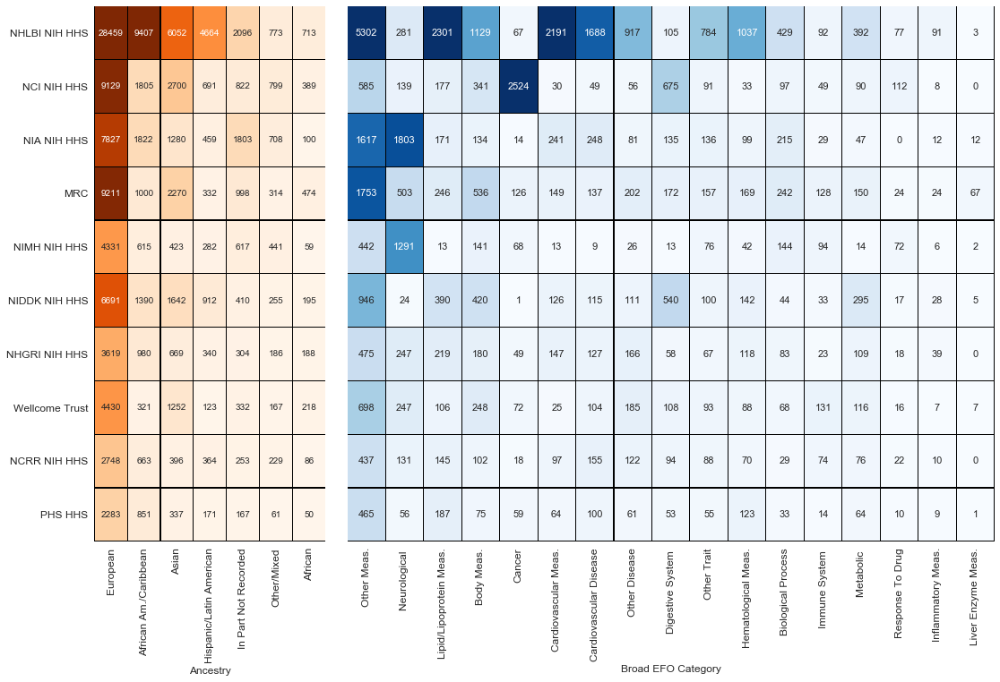

In [31]:
FunderInfo, AbstractInfo, AuthorMaster = load_pubmed_data()
Cat_Studies, Cat_Ancestry, Cat_Ancestry_groupedbyN, Cat_Full = load_gwas_cat()
EFO_Parent_Mapped, EFO_Parent_Mapped_NoCommas = EFO_parent_mapper(
    Cat_Studies, Cat_Ancestry_groupedbyN)

EFO_Parent_Mapped_NoCommas['Parent term'] = \
    EFO_Parent_Mapped_NoCommas['Parent term'].str.replace('Disorder', '')

FunderInfo_Parent = pd.merge(FunderInfo, EFO_Parent_Mapped_NoCommas,
                             left_on='PUBMEDID', right_on='PUBMEDID',
                             how='left')

funder_ancestry, funder_parent = make_funders(FunderInfo_Parent, FunderInfo, Cat_Ancestry)
output_path = os.path.abspath(os.path.join('__file__', '../..', 'figures',
                                         'svg', 'Figure_4_NoCommas.svg'))
plot_heatmap(funder_ancestry, funder_parent, output_path)

# Who are the Authors?

Who are the most cited authors? What is their 'GWAS H-Index' calculated based only on their papers in the GWAS catalogue? This assumes unique forename + surname combinations, and that the same author is recorded consistently across studies. First a couple of snippets:

In [32]:
FunderInfo, AbstractInfo, AuthorMaster = load_pubmed_data()
print('There are a total of ' + str(len(AuthorMaster)) +
      ' "authorship contributions".')
print('These contributions are made by ' +
      str(len(AuthorMaster['AUTHORNAME'].unique())) + ' unique authors.')
print('There are a total of ' +
      str(len(AuthorMaster) /
          len(AuthorMaster['PUBMEDID'].drop_duplicates())) +
      ' "authorship contributions per paper".')
print('The study with the most number of authors has ' +
      str(AuthorMaster.groupby(['PUBMEDID']).size().max()) +
      ' authors (PubMed ID: ' +
      str(AuthorMaster.groupby(['PUBMEDID']).size().idxmax()) + ')')

There are a total of 115929 "authorship contributions".
These contributions are made by 38645 unique authors.
There are a total of 33.55397973950796 "authorship contributions per paper".
The study with the most number of authors has 559 authors (PubMed ID: 22479202)


## Calculate 'GWAS-H' indexes

Lets then calculate our GWAS-H indexes using citation data and paper counts for unique authors.

In [33]:
CitationCounts = pd.read_csv(os.path.abspath(
    os.path.join('__file__', "../..",
                 "data", "PUBMED", 'Pubmed_Cites.csv')))
AuthorMaster_withcites = pd.merge(
    AuthorMaster, CitationCounts, on=['PUBMEDID'], how='left')
allauthors_formerge = pd.DataFrame(
    AuthorMaster_withcites[['AUTHORNAME', 'citedByCount']])
allauthors_papercount = pd.DataFrame(
    allauthors_formerge['AUTHORNAME'].value_counts())
allauthors_citecount = pd.DataFrame(
    allauthors_formerge.groupby(by='AUTHORNAME')['citedByCount'].sum())
allauthors_merged = pd.merge(
    allauthors_papercount, allauthors_citecount, left_index=True,
    right_index=True)
allauthors_merged.columns = ['Papers', 'citedByCount']
allauthors_merged = allauthors_merged.sort_values(
    by='citedByCount', ascending=False)
allauthors_merged['GWAS-H'] = np.NaN
counter = 0
for author in allauthors_merged.index:
    counter += 1
    temp = AuthorMaster_withcites[AuthorMaster_withcites['AUTHORNAME'] ==
                                  author].sort_values(by='citedByCount',
                                                      ascending=False).dropna()
    temp = temp.reset_index()
    temp = temp.drop('index', 1)
    for pubnumber in range(0, len(temp)):
        if pubnumber + 1 >= temp['citedByCount'][pubnumber]:
            allauthors_merged.loc[author, ('GWAS-H')] = int(pubnumber)
            break
    sys.stdout.write('\r' + 'Calculating GWAS H-indices: finished ' +
                     str(counter) + ' of ' +
                     str(len(allauthors_merged.index)) + ' authors...')
allauthors_citecount.reset_index(inplace=True)
allauthors_papercount.reset_index(inplace=True)
allauthors_papercount.rename(
    columns={'AUTHORNAME': 'PAPERCOUNT', 'index': 'AUTHORNAME', },
    inplace=True)


Calculating GWAS H-indices: finished 38645 of 38645 authors...

## Compare Author Metrics Between Genders

## Calculate author centralities

Lets next calculate some measures of authorship centrality with Network-X. Note: this can take some time on slow computers. To get it to run faster, change the CitedByCount to be something like 100 to filter for authors with a minimum of a hundred citations only (or change PAPERCOUNT>1)

In [34]:
AuthorMaster_sumcites = pd.merge(AuthorMaster, allauthors_citecount,
                                 left_on='AUTHORNAME', right_on='AUTHORNAME',
                                 how='left')
AuthorMaster_sumcitespapercount = pd.merge(AuthorMaster_sumcites,
                                           allauthors_papercount,
                                           left_on='AUTHORNAME',
                                           right_on='AUTHORNAME', how='left')
AuthorMaster_sumcitespapercount_filter_cites = AuthorMaster_sumcitespapercount[
    AuthorMaster_sumcitespapercount['citedByCount'] > 10]
AuthorMaster_sumcitespapercount_filtered =\
    AuthorMaster_sumcitespapercount_filter_cites[
        AuthorMaster_sumcitespapercount_filter_cites['PAPERCOUNT'] > 1]

G = nx.Graph()
counter = 0
alledges = []
for paper in AuthorMaster_sumcitespapercount_filtered['PUBMEDID'].unique():
    counter += 1
    temp = AuthorMaster_sumcitespapercount_filtered[
        AuthorMaster_sumcitespapercount_filtered['PUBMEDID'] == paper]
    if len(temp) > 1:
        templist = list(itertools.combinations(temp.AUTHORNAME, 2))
        for edge in templist:
            alledges.append(edge)
G.add_edges_from(list(set(alledges)))

print('This gives us a network with ' + str(len(G)) +
      ' nodes.\nThese are unique authors with >1 paper and >10 cites')

betcent = pd.Series(nx.betweenness_centrality(G), name='Betweenness')
allauthors_merged = allauthors_merged.merge(
    betcent.to_frame(), left_index=True, right_index=True)

degcent = pd.Series(nx.degree_centrality(G), name='Degree')
allauthors_merged = allauthors_merged.merge(
    degcent.to_frame(), left_index=True, right_index=True)

This gives us a network with 14554 nodes.
These are unique authors with >1 paper and >10 cites


We can then merge all this data with some data collected manually from web searches related to their country of employment, their current employer, etc. We then rank in three different ways to analyze overlap between the three metrics.

In [35]:
authorsupplemental = pd.read_csv(os.path.abspath(
    os.path.join('__file__', "../..",
                 "Data", "Support", 'Author_Supplmentary.csv')),
     encoding='latin-1', index_col=0)
allauthors_merged_withsupp = pd.merge(allauthors_merged,
                                      authorsupplemental,
                                      left_index=True, right_index=True,
                                      how='left',)
allauthors_merged_withsupp['Betweenness'] = round(allauthors_merged_withsupp['Betweenness'],3)
allauthors_merged_withsupp['Degree'] = round(allauthors_merged_withsupp['Degree'],3)
allauthors_merged_withsupp['CitePercentile'] = round(allauthors_merged_withsupp.citedByCount.rank(pct=True),4)
allauthors_merged_withsupp.sort_values(by='GWAS-H',
                                       ascending=False).to_csv(
    os.path.abspath(os.path.join('__file__',
                                 "../..",
                                 "tables", "Authors.csv")))
allauthors_merged_withsupp.sort_values(by='GWAS-H', ascending=False).head(20)

,Papers,citedByCount,GWAS-H,Betweenness,Degree,Country,Institution,CitePercentile
Kari Stefansson,172,26391,82.0,0.020,0.306,Iceland,deCode Genetics,1.0000
Unnur Thorsteinsdottir,137,22660,74.0,0.006,0.240,Iceland,deCode Genetics,0.9999
Andre G Uitterlinden,267,22022,74.0,0.018,0.365,Netherlands,Erasmus MC,0.9998
Albert Hofman,258,24233,74.0,0.014,0.346,U.S.,University of Harvard,0.9999
Cornelia M van Duijn,180,19717,69.0,0.008,0.292,Netherlands,UMC Rotterdam,0.9996
Gudmar Thorleifsson,115,19499,68.0,0.006,0.230,Iceland,deCode Genetics,0.9995
Christian Gieger,160,21447,67.0,0.011,0.272,Germany,Helmholtz-Muenchen,0.9997
H-Erich Wichmann,109,19592,67.0,0.007,0.221,Germany,Helmholtz-Muenchen,0.9995
Panos Deloukas,104,19343,67.0,0.009,0.231,U.K.,Queen Mary UoL,0.9994
Fernando Rivadeneira,191,17106,63.0,0.009,0.285,Netherlands,UMC Rotterdam,0.9992


In [36]:
allauthors_merged_withsupp.sort_values(by='Degree',ascending=False).head(10)

,Papers,citedByCount,GWAS-H,Betweenness,Degree,Country,Institution,CitePercentile
Andre G Uitterlinden,267,22022,74.0,0.018,0.365,Netherlands,Erasmus MC,0.9998
Albert Hofman,258,24233,74.0,0.014,0.346,U.S.,University of Harvard,0.9999
Kari Stefansson,172,26391,82.0,0.020,0.306,Iceland,deCode Genetics,1.0000
Cornelia M van Duijn,180,19717,69.0,0.008,0.292,Netherlands,UMC Rotterdam,0.9996
Fernando Rivadeneira,191,17106,63.0,0.009,0.285,Netherlands,UMC Rotterdam,0.9992
Jerome I Rotter,174,16920,59.0,0.011,0.275,U.S.,UCLA,0.9991
Christian Gieger,160,21447,67.0,0.011,0.272,Germany,Helmholtz-Muenchen,0.9997
Nicholas G Martin,154,12836,57.0,0.009,0.259,Australia,QIMR Berghofer,0.9970
Grant W Montgomery,148,13021,54.0,0.008,0.255,Australia,University of Queensland,0.9973
Bruce M Psaty,158,12224,57.0,0.005,0.255,U.S.,University of Washington,0.9964


In [37]:
allauthors_merged_withsupp.sort_values(by='citedByCount',
                                       ascending=False).head(10)

,Papers,citedByCount,GWAS-H,Betweenness,Degree,Country,Institution,CitePercentile
Kari Stefansson,172,26391,82.0,0.020,0.306,Iceland,deCode Genetics,1.0000
Albert Hofman,258,24233,74.0,0.014,0.346,U.S.,University of Harvard,0.9999
Unnur Thorsteinsdottir,137,22660,74.0,0.006,0.240,Iceland,deCode Genetics,0.9999
Andre G Uitterlinden,267,22022,74.0,0.018,0.365,Netherlands,Erasmus MC,0.9998
Christian Gieger,160,21447,67.0,0.011,0.272,Germany,Helmholtz-Muenchen,0.9997
Mark I McCarthy,94,19769,61.0,0.003,0.184,U.K.,University of Oxford,0.9997
Cornelia M van Duijn,180,19717,69.0,0.008,0.292,Netherlands,UMC Rotterdam,0.9996
H-Erich Wichmann,109,19592,67.0,0.007,0.221,Germany,Helmholtz-Muenchen,0.9995
Gudmar Thorleifsson,115,19499,68.0,0.006,0.230,Iceland,deCode Genetics,0.9995
Panos Deloukas,104,19343,67.0,0.009,0.231,U.K.,Queen Mary UoL,0.9994


And then make a simple correlation matrix to check how highly related these metrics are:

In [38]:
allauthors_merged_withsupp[['citedByCount', 'GWAS-H',
                            'Betweenness', 'Degree', 'Papers']].corr()

,citedByCount,GWAS-H,Betweenness,Degree,Papers
citedByCount,1.000000,0.913395,0.499866,0.821371,0.844252
GWAS-H,0.913395,1.000000,0.573366,0.905645,0.941374
Betweenness,0.499866,0.573366,1.000000,0.478012,0.638423
Degree,0.821371,0.905645,0.478012,1.000000,0.849383
Papers,0.844252,0.941374,0.638423,0.849383,1.000000


In [39]:
print('There are a total of ' +
      str(len(allauthors_merged_withsupp)) + ' authors in the table.')
print('The person with the highest G-WAS H-Index is: ' +
      allauthors_merged_withsupp['GWAS-H'].idxmax())
print('The person with the highest Degree is: ' +
      allauthors_merged_withsupp['Degree'].idxmax())
print('The person with the highest citedByCount is: ' +
      allauthors_merged_withsupp['citedByCount'].idxmax())
print('The person with the most number of Papers is: ' +
      allauthors_merged_withsupp['Papers'].idxmax())

There are a total of 14554 authors in the table.
The person with the highest G-WAS H-Index is: Kari Stefansson
The person with the highest Degree is: Andre G Uitterlinden
The person with the highest citedByCount is: Kari Stefansson
The person with the most number of Papers is: Andre G Uitterlinden


## Author gender

Lets consider the gender of each author by analyzing their forenames using the genderguesser library. We can directly compare our results to [this wonderful paper](http://journals.plos.org/plosone/article?id=10.1371/journal.pone.0066212). One of the key assumptions made here is to combine all 'mostly_' male and female names into their respective male/female categories.

In [50]:
gendet = gender.Detector()
FunderInfo, AbstractInfo, AuthorMaster = load_pubmed_data()
Cat_Studies, Cat_Ancestry, Cat_Ancestry_groupedbyN, Cat_Full = load_gwas_cat()

AuthorCounts = AuthorMaster.groupby(['PUBMEDID'])['AUTHORNAME'].count(
).to_frame().reset_index().rename(columns={"AUTHORNAME": "Author Count"})
AuthorMaster = pd.merge(AuthorMaster, AuthorCounts, how='left', on='PUBMEDID')
AuthorMaster['CleanForename'] = AuthorMaster['FORENAME'].map(
    lambda x: clean_names(x))
AuthorMaster['CleanGender'] = AuthorMaster['CleanForename'].map(
    lambda x: gendet.get_gender(x))
AuthorMaster['MaleFemale'] = AuthorMaster['CleanGender'].str.replace('mostly_',
                                                                     '')
AuthorMaster['isfemale'] = np.where(
    AuthorMaster['MaleFemale'] == 'female', 1, 0)
AuthorFirst = AuthorMaster[AuthorMaster['Author Count']
                           > 4].drop_duplicates(subset='PUBMEDID', keep='first')
AuthorLast = AuthorMaster[AuthorMaster['Author Count']
                          > 4].drop_duplicates(subset='PUBMEDID', keep='last')
AuthorUnique = AuthorMaster.drop_duplicates(subset='AUTHORNAME')

for gender_ in AuthorMaster['CleanGender'].unique():
    print(str(round((len(AuthorMaster[AuthorMaster['CleanGender'] == gender_]) /
                     len(AuthorMaster['CleanGender'])) * 100, 2)) + '%' +
          ' ' + gender_ + ' authorship contributions in total')
    print(str(round((len(AuthorUnique[AuthorUnique['CleanGender'] == gender_]) /
                     len(AuthorUnique['CleanGender'])) * 100, 2)) + '%' +
          ' ' + gender_ + ' authors contributions in total')
    print(str(round((len(AuthorFirst[AuthorFirst['CleanGender'] == gender_]) /
                     len(AuthorFirst['CleanGender'])) * 100, 2)) + '%' +
          ' ' + gender_ + ' first authors in total')
    print(str(round((len(AuthorLast[AuthorLast['CleanGender'] == gender_]) /
                     len(AuthorFirst['CleanGender'])) * 100, 2)) + '%' +
          ' ' + gender_ + ' last authors in total')

print('\nPercent of male author contributions: ' +
      str(round(len(AuthorMaster[AuthorMaster['MaleFemale'] == 'male']) /
                (len(AuthorMaster[(AuthorMaster['MaleFemale'] == 'male') |
                                  (AuthorMaster['MaleFemale'] == 'female')])) *
                100, 3)) + '%')

print('Percent of unique male authors: ' +
      str(round(len(AuthorUnique[AuthorUnique['MaleFemale'] == 'male']) /
                (len(AuthorUnique[(AuthorUnique['MaleFemale'] == 'male') |
                                  (AuthorUnique['MaleFemale'] == 'female')])) *
                100, 3)) + '%')

print('Percent of male first authors: ' +
      str(round(len(AuthorFirst[AuthorFirst['MaleFemale'] == 'male']) /
                (len(AuthorFirst[(AuthorFirst['MaleFemale'] == 'male') |
                                 (AuthorFirst['MaleFemale'] == 'female')])) *
                100, 3)) + '%')

print('Percent of male last authors: ' +
      str(round(len(AuthorLast[AuthorLast['MaleFemale'] == 'male']) /
                (len(AuthorLast[(AuthorLast['MaleFemale'] == 'male') |
                                (AuthorLast['MaleFemale'] == 'female')])) *
                100, 3)) + '%')

AuthorMaster_filtered = AuthorMaster[(AuthorMaster['MaleFemale'].str.contains(
    'male')) & (AuthorMaster['Author Count'] > 4)]
AuthorMaster_filtered_merged_bydisease = pd.merge(
    AuthorMaster_filtered, Cat_Studies[['PUBMEDID', 'DISEASE/TRAIT']],
    how='left', on='PUBMEDID')

meanfemales_bydisease = AuthorMaster_filtered_merged_bydisease.groupby(
    ['DISEASE/TRAIT'])['isfemale'].mean().to_frame()
numberofstudies_bydisease = Cat_Studies.groupby(
    ['DISEASE/TRAIT'])['DISEASE/TRAIT'].count().to_frame()
mergedgender_andcount_bydisease = pd.merge(
    numberofstudies_bydisease, meanfemales_bydisease, left_index=True,
    right_index=True)
mergedgender_andcount_bydisease = mergedgender_andcount_bydisease.sort_values(
    by='DISEASE/TRAIT', ascending=False)[0:10]
holdstring = 'Percent of authorships across 10 most commonly studied diseases:\n'
for index, row in mergedgender_andcount_bydisease.iterrows():
    holdstring = holdstring + \
        index.title() + ' (' + str(round(row['isfemale'], 3) * 100) + '%)\n'
print('\n' + holdstring[:-2])

26.01% female authorship contributions in total
23.99% female authors contributions in total
27.08% female first authors in total
19.33% female last authors in total
45.43% male authorship contributions in total
35.05% male authors contributions in total
34.98% male first authors in total
49.16% male last authors in total
21.37% unknown authorship contributions in total
32.98% unknown authors contributions in total
28.14% unknown first authors in total
24.27% unknown last authors in total
1.34% mostly_male authorship contributions in total
1.54% mostly_male authors contributions in total
1.3% mostly_male first authors in total
1.72% mostly_male last authors in total
4.48% andy authorship contributions in total
5.05% andy authors contributions in total
7.28% andy first authors in total
3.76% andy last authors in total
1.38% mostly_female authorship contributions in total
1.4% mostly_female authors contributions in total
1.21% mostly_female first authors in total
1.78% mostly_female last

In [41]:
Cat_Studies, Cat_Ancestry, Cat_Ancestry_groupedbyN, Cat_Full = load_gwas_cat()
EFO_Parent_Mapped, EFO_Parent_Mapped_NoCommas = EFO_parent_mapper(
    Cat_Studies, Cat_Ancestry_groupedbyN)

ranks, countstudiesperEFO, meanfemale, AuthorMaster_EFO, AuthorMaster_Parent = make_meanfemale_andranks(AuthorMaster,
                                                                                    EFO_Parent_Mapped)
output_path = os.path.abspath(os.path.join('__file__', "../..", "figures",
                                           'svg', 'Sup_Figure_1_Commas.svg'))
boxswarm_plot(meanfemale, ranks, output_path)

AuthorMaster_Parent.reset_index(inplace=True)
holdstring = 'Get the numbers for Parent Terms:\n'
for index, row in AuthorMaster_Parent.iterrows():
    holdstring = holdstring + row['Parent term'].title() + ' (' \
        + str(round(row['isfemale'], 3) * 100) + '%)\n'
print('\n' + holdstring[:-2])
holdstring = 'Get the numbers for Trait Terms (figure above):\n'
for index, row in AuthorMaster_EFO[
    AuthorMaster_EFO['EFO term'].isin(countstudiesperEFO)].sort_values(
        by='isfemale', ascending=False).iterrows():
    holdstring = holdstring + \
        row['EFO term'].title() + ' (' + str(round(row['isfemale'], 3) *
                                             100) + '%)\n'
print('\n' + holdstring[:-2])


Get the numbers for Parent Terms:
Biological Process (41.199999999999996%)
Body Meas. (41.3%)
Cancer (47.0%)
Cardiovascular Disease (32.7%)
Cardiovascular Meas. (32.9%)
Digestive System Disorder (31.7%)
Hematological Meas. (34.300000000000004%)
Immune System Disorder (35.699999999999996%)
Inflammatory Meas. (34.1%)
Lipid/Lipoprotein Meas. (35.4%)
Liver Enzyme Meas. (37.3%)
Metabolic Disorder (33.2%)
Neurological Disorder (35.099999999999994%)
Other Disease (34.5%)
Other Meas. (38.2%)
Other Trait (35.6%)
Response To Drug (35.6%

Get the numbers for Trait Terms (figure above):
Breast Carcinoma (50.9%)
Prostate Carcinoma (41.6%)
Body Mass Index (40.9%)
Bipolar Disorder (37.1%)
Alzheimers Disease (36.7%)
Colorectal Cancer (36.4%)
Asthma (36.4%)
Triglyceride Meas. (35.8%)
Rheumatoid Arthritis (35.199999999999996%)
Unipolar Depression (34.9%)
Hd Lc Measurement (34.8%)
Ld Lc Measurement (34.2%)
Type Ii Diabetes Mellitus (32.1%)
Schizophrenia (31.0%


Lets do exactly the same thing as above, but drop the fields with commas in:

In [42]:
ranks, countstudiesperEFO, meanfemale, AuthorMaster_EFO, AuthorMaster_Parent = make_meanfemale_andranks(AuthorMaster, EFO_Parent_Mapped_NoCommas)
output_path = os.path.abspath(os.path.join('__file__', "../..", "figures",
                                           'svg', 'Sup_Figure_1_NoCommas.svg'))
boxswarm_plot(meanfemale, ranks, output_path)

AuthorMaster_Parent.reset_index(inplace=True)
holdstring = 'Get the numbers for Parent Terms:\n'
for index, row in AuthorMaster_Parent.iterrows():
    holdstring = holdstring + row['Parent term'].title() + ' (' \
        + str(round(row['isfemale'], 3) * 100) + '%)\n'
print('\n' + holdstring[:-2])
holdstring = 'Get the numbers for Trait Terms (figure above):\n'
for index, row in AuthorMaster_EFO[
    AuthorMaster_EFO['EFO term'].isin(countstudiesperEFO)].sort_values(
        by='isfemale', ascending=False).iterrows():
    holdstring = holdstring + \
        row['EFO term'].title() + ' (' + str(round(row['isfemale'], 3) *
                                             100) + '%)\n'
print('\n' + holdstring[:-2])


Get the numbers for Parent Terms:
Biological Process (37.4%)
Body Meas. (39.7%)
Cancer (48.4%)
Cardiovascular Disease (30.5%)
Cardiovascular Meas. (32.800000000000004%)
Digestive System Disorder (32.2%)
Hematological Meas. (34.9%)
Immune System Disorder (35.4%)
Inflammatory Meas. (31.4%)
Lipid/Lipoprotein Meas. (35.8%)
Liver Enzyme Meas. (38.800000000000004%)
Metabolic Disorder (33.1%)
Neurological Disorder (35.3%)
Other Disease (34.5%)
Other Meas. (36.7%)
Other Trait (34.699999999999996%)
Response To Drug (33.300000000000004%

Get the numbers for Trait Terms (figure above):
Breast Carcinoma (50.7%)
Prostate Carcinoma (41.4%)
Body Mass Index (39.300000000000004%)
Asthma (36.6%)
Alzheimers Disease (36.5%)
Body Height (36.3%)
Triglyceride Meas. (35.8%)
Bone Density (35.0%)
Hd Lc Measurement (34.8%)
Ld Lc Measurement (34.300000000000004%)
Bipolar Disorder (34.0%)
Colorectal Cancer (33.800000000000004%)
Type Ii Diabetes Mellitus (31.5%)
Schizophrenia (30.0%


## Compare Author Metrics Between Genders

In [43]:
allauthors_merged_reset = allauthors_merged.reset_index().rename(columns={'index': 'Name'})
allauthors_merged_reset['CleanForename'] = allauthors_merged_reset['Name'].map(lambda x: x.split(' ')[0]) 
allauthors_merged_reset['CleanGender'] = allauthors_merged_reset['CleanForename'].map(
    lambda x: gendet.get_gender(x))
allauthors_merged_reset['MaleFemale'] = allauthors_merged_reset['CleanGender'].str.replace('mostly_',
                                                                     '')
allauthors_merged_reset['isfemale'] = np.where(
   allauthors_merged_reset['MaleFemale'] == 'female', 1, 0)

print('The average GWAS-H Index for females is: ' +
      str(round(allauthors_merged_reset[allauthors_merged_reset['MaleFemale']=='female']['GWAS-H'].mean(),3)))
print('The average GWAS-H Index for males is: ' +
      str(round(allauthors_merged_reset[allauthors_merged_reset['MaleFemale']=='male']['GWAS-H'].mean(),3)))
print('The average number of papers published by females is: ' +
      str(round(allauthors_merged_reset[allauthors_merged_reset['MaleFemale']=='female']['Papers'].mean(),3)))
print('The average number of papers published by males is: ' +
     str(round(allauthors_merged_reset[allauthors_merged_reset['MaleFemale']=='male']['Papers'].mean(),3)))
print('The average number of citations for females is: ' +
      str(round(allauthors_merged_reset[allauthors_merged_reset['MaleFemale']=='female']['citedByCount'].mean(),3)))
print('The average number of citations for females is: ' +
      str(round(allauthors_merged_reset[allauthors_merged_reset['MaleFemale']=='male']['citedByCount'].mean(),3)))

The average GWAS-H Index for females is: 7.069
The average GWAS-H Index for males is: 7.844
The average number of papers published by females is: 6.003
The average number of papers published by males is: 7.035
The average number of citations for females is: 636.132
The average number of citations for females is: 771.197


# Cohorts and Consortium

## Consortium/collectives

Lets use the PubMed database returns on collectives to analyze which consortium and study groups are acknowledged:

In [44]:
pubmed_collectives = pd.read_csv(os.path.abspath(
                                 os.path.join('__file__', '../..',
                                              'data', 'PUBMED',
                                              'Pubmed_CollectiveInfo.csv')),
                                 encoding='latin-1')
collect_dict = pd.read_csv(os.path.abspath(
                           os.path.join(
                               '__file__', '../..', 'Data',
                               'Support', 'Collectives',
                               'Collective_Dictionary.csv')),
                           encoding='latin-1')
pubmed_collectives['COLLECTIVE'] = pubmed_collectives['COLLECTIVE'].str.strip()
pubmed_collectives['COLLECTIVE'] = pubmed_collectives['COLLECTIVE'].str.lower()
collect_dict['COLLECTIVE'] = collect_dict['COLLECTIVE'].str.strip(
).str.lower()
merged_collect = pd.merge(
    pubmed_collectives, collect_dict, how='left', on='COLLECTIVE')
if len(merged_collect[merged_collect['Clean_Name'].isnull()]) > 0:
    print('Danger! Correct collectives in Collective_Unverified.csv ' +
          'and add to the dictionary\n')
    unverified_collect = merged_collect[merged_collect['Clean_Name'].isnull(
    )]
    unverified_collect.to_csv(os.path.abspath(
                              os.path.join('__file__', '../..',
                                           'Data', 'Support', 'Collectives',
                                           'Collective_Unverified.csv')))
else:
    print('The consortium dictionary is up to date!\n')
consortiumlist = []
for index, row in merged_collect.iterrows():
    if pd.isnull(row['Clean_Name']) is False:
        for consortium in row['Clean_Name'].split(';'):
            consortiumlist.append(consortium)
clean_collectives = pd.DataFrame(consortiumlist, columns=['Consortium'])
groupby_collectives = clean_collectives.groupby(
    ['Consortium'])['Consortium'].count().sort_values(ascending=False)
holdstring = 'The most frequently seen Consortium are:\n'
for index, row in groupby_collectives.to_frame()[0:10].iterrows():
    holdstring = holdstring + index + ' (' + str(row['Consortium']) + ')\n'
print(holdstring[:-2] + '.')

print('\nWe have seen a total of ' +
      str(len(groupby_collectives.to_frame())) + ' different collectives!')
print('A total of ' + str(len(pubmed_collectives['PUBMEDID'].drop_duplicates(
))) + ' papers are contributed to by at least one collective.')
print('A total of ' + str(groupby_collectives.sum()) +
      ' collective contributions are made.')

Danger! Correct collectives in Collective_Unverified.csv and add to the dictionary

The most frequently seen Consortium are:
Wellcome Trust Case Control Consortium (46)
CHARGE (39)
Wellcome Trust Case Control Consortium 2 (36)
LifeLines Cohort Study (28)
DIAGRAM (28)
Alzheimer's Disease Neuroimaging Initiative (25)
CARDIOGRAM (24)
MAGIC (19)
GIANT Consortium (16)
kConFab (16.

We have seen a total of 607 different collectives!
A total of 800 papers are contributed to by at least one collective.
A total of 1480 collective contributions are made.


## Datasets

Lets now simply wrangle together some of the manually collated data and consider the most frequently observed cohorts, with the aim being to analyze the resampling issue discussed earlier in the literature.

In [45]:
finaldataset = pd.read_csv(os.path.abspath(
    os.path.join('__file__', '../..', 'data',
                 'Support', 'Cohorts',
                 'GWASCat1to1000 final.csv')),
    encoding='latin-1',
    index_col='Number')
mylist = []
for index, row in finaldataset.iterrows():
    mylist = mylist + row['DATASETS'].split(';')

mylist = [x.strip(' ') for x in mylist]
df1 = pd.DataFrame({'Cohorts': mylist})
reader = csv.reader(open(os.path.abspath(os.path.join(
    '__file__', '../..', 'data', 'Support', 'Cohorts',
    'Dictionary_cohorts.csv')), 'r'))
d = {}
for row in reader:
    k, v = row
    d[k] = v
for key in d:
    df1['Cohorts'].replace(key, d[key], inplace=True)
df1['Cohorts'] = df1['Cohorts'].str.replace(
    'Rotterdam Study I (RS-I)', 'Rotterdam Study (RS)')
newdf = pd.DataFrame(df1.groupby(['Cohorts'])[
                     'Cohorts'].count(), columns=['Count'])

newdf = pd.DataFrame({'Count': df1.groupby(['Cohorts']).size()}).reset_index()

Then merge this with manually collated data:

In [46]:
manual_cohort_for_merge = pd.read_csv(os.path.abspath(
    os.path.join('__file__', "../..", "data",
                 "Support", "Cohorts",
                 "manual_cohort_for_merge.csv")),
    encoding='latin-1', index_col=False)
merged_manual = pd.merge(newdf, manual_cohort_for_merge,
                         how='left', on='Cohorts')
merged_manual.set_index('Cohorts').sort_values(
    by='Count', ascending=False).drop('NO NAME').head(10).style

,Count,N,Ancestry,Country of Recruitment,Age Range,Study Design,Female (%)
Cohorts,,,,,,,
Rotterdam Study (RS),373,14926,Netherlands,Netherlands,55-106,Prospective cohort,57.14
Atherosclerosis Risk in Communities Study (ARIC),187,15792,nan,US,45-64,"Prospective cohort, Community",55.15
Framingham Heart Study (FHS),183,15447,US,US,30-62 (original) now 5-85,"Prospective cohort, three generation",53.6
Cardiovascular Health Study (CHS),163,5888,US,US,65+,Prospective cohort,57.64
British 1958 Birth Cohort Study (B58C),144,17634,"England, Wales, Scotland",UK,0+,Prospective birth cohort,48
Study of Health in Pomerania (SHIP),120,4308,German,Germany,20-79,Prospective cohort,50.84
UK Adult Twin Register (TwinsUK),120,12000,"United Kingdom, Ireland","UK, Ireland",18-103,Longitudinal entry at various times,80
Nurses Health Study (NHS),112,121700,US,US,30-55,Prospective cohort,100
Aging Gene-Environment Susceptibility - Reykjavik Study (AGES),110,30795,Iceland,Iceland,33-84,Prospective cohort,51.55


In [47]:
print('We guess there are a total of ' + str(len(newdf)) +
      ' different cohorts used in the 1000 biggest studies.')

We guess there are a total of 1852 different cohorts used in the 1000 biggest studies.


Lets now print out a list of the 50 most commonly used datasets in case we need to reference any specific particularily prominent ones (e.g. deCODE, UKBioBank etc):

In [48]:
merged_manual=merged_manual.set_index('Cohorts').sort_values(
    by='Count', ascending=False).drop('NO NAME')[['Count']]
holder='The 30 most commonly used datasets are:\n\n'
for index, row in merged_manual[0:30].iterrows():
    holder = holder + \
        str(index) + ' (' + str(row['Count']) + ' times)\n'
print(holder[:-2])

The 30 most commonly used datasets are:

Rotterdam Study (RS) (373 times)
Atherosclerosis Risk in Communities Study (ARIC) (187 times)
Framingham Heart Study (FHS) (183 times)
Cardiovascular Health Study (CHS) (163 times)
British 1958 Birth Cohort Study (B58C) (144 times)
Study of Health in Pomerania (SHIP) (120 times)
UK Adult Twin Register (TwinsUK) (120 times)
Nurses Health Study (NHS) (112 times)
Aging Gene-Environment Susceptibility - Reykjavik Study (AGES) (110 times)
European Prospective Investigation into Cancer (EPIC) (108 times)
Wellcome Trust Case Control Consortium (WTCCC) (103 times)
deCODE Genetics (deCODE) (101 times)
Erasmus Rucphen Family Study (ERF) (94 times)
Northern Finnish Birth Cohort Study (NFBC) (83 times)
Cooperative Health Research in the Region of Augsburg (KORA) (81 times)
Health, Aging, and Body Composition Study (Health ABC) (81 times)
Multi-Ethnic Study of Atherosclerosis (MESA) (79 times)
Netherlands Twin Registry (NTR) (74 times)
Lothian Birth Cohort (

In [49]:
Cat_Studies, Cat_Ancestry, Cat_Ancestry_groupedbyN, Cat_Full = load_gwas_cat()
PUBMED_by_N = Cat_Ancestry.groupby(['PUBMEDID'])['N'].agg('sum').sort_values(ascending=False)
PUBMED_by_N = PUBMED_by_N[0:1000]
print("We're currently missing " +
      str(len(set(PUBMED_by_N.index)-set(finaldataset['PUBMEDID']))) + 
     " of the biggest 1000 papers grouped by summed ancestry!")
output_path = os.path.abspath(
    os.path.join('__file__',
                 '../..',
                 'data',
                 'Support',
                 'Cohorts',
                 'MissingLargestCohorts.csv'))
with open(output_path, 'w') as file_handler:
    for item in (set(PUBMED_by_N.index)-set(finaldataset['PUBMEDID'])):
        file_handler.write("{}\n".format(item))
print('The PUBMEDIDs we are missing is saved in Data/Support/Cohorts/MissingLargestCohorts.csv')

We're currently missing 234 of the biggest 1000 papers grouped by summed ancestry!
The PUBMEDIDs we are missing is saved in Data/Support/Cohorts/MissingLargestCohorts.csv
